In [1]:
import numpy as np 
from PIL import Image
from pathlib import Path 
from tqdm import tqdm

# Load data

In [123]:
DATA_DIR = Path().absolute().parent / "data"
REAL_DATASET_NAME = "real_faces_dataset"
CK_DATASET_NAME = "ck_faces_dataset"

REAL_DATASET_EMBEDDINGS_DIR = DATA_DIR / (REAL_DATASET_NAME + "_embeddings")
CK_DATASET_EMBEDDINGS_DIR = DATA_DIR / (CK_DATASET_NAME + "_embeddings")


In [124]:
ck_images = np.load(CK_DATASET_EMBEDDINGS_DIR / "alligned_images.npy")
ck_labels = np.load(CK_DATASET_EMBEDDINGS_DIR / "alligned_labels.npy", allow_pickle=True)

real_images = np.load(REAL_DATASET_EMBEDDINGS_DIR / "alligned_images.npy")
real_labels = np.load(REAL_DATASET_EMBEDDINGS_DIR / "alligned_labels.npy", allow_pickle=True)

print("CK images shape:", ck_images.shape)
print("CK labels shape:", ck_labels.shape)
print("Real images shape:", real_images.shape)
print("Real labels shape:", real_labels.shape)

CK images shape: (20, 112, 112, 3)
CK labels shape: (20,)
Real images shape: (201, 112, 112, 3)
Real labels shape: (201,)


In [125]:
def load_embedings_dataset(data_dir: Path):
    model2embeddings = {}
    embeddings_files = list(data_dir.glob('embeddings*.npy'))
    for embeddings_file in tqdm(embeddings_files):
        model_name = "-".join(embeddings_file.stem.split('_')[1:])
        model2embeddings[model_name] = np.load(embeddings_file)
    return model2embeddings

model2ck_embeddings: dict[str, np.ndarray] = load_embedings_dataset(CK_DATASET_EMBEDDINGS_DIR)
model2real_embeddings: dict[str, np.ndarray] = load_embedings_dataset(REAL_DATASET_EMBEDDINGS_DIR)
assert model2ck_embeddings.keys() == model2real_embeddings.keys()
for model_name, emb in model2ck_embeddings.items():
    print(f"Model {model_name}:")
    print(f"CK dataset embeddings shape: {emb.shape}")
    print(f"Real dataset embeddings shape: {model2real_embeddings[model_name].shape}")
    print()

100%|██████████| 10/10 [00:00<00:00, 2064.02it/s]

Model arcface-r100:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model cosface-r100:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model casia-webface:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model cosface-r18:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model cosface-r34:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model vggface2:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model arcface-r50:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model cosface-r50:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model arcface-r34:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (201, 512)

Model arcface-r18:
CK dataset embeddings shape: (20, 512)
Real dataset embeddings shape: (

In [114]:
# def correct_mbeddings(model2embeddings, images):
#     batch_size = 32
#     model2correct_mebeddings = {}
#     for model_name, embeddings in model2embeddings.items():
#         print(model_name)
#         if embeddings.shape[0] == images.shape[0]:
#             print(model_name, " has correct embeddings shape")
#             continue 
        
#         correct_embeddings = []
#         for i in tqdm(range(0, images.shape[0], batch_size)):
#             wrong_images= images[i:i+128]
#             correct_images = wrong_images[:batch_size]
#             correct_batch = embeddings[:correct_images.shape[0]]
#             correct_embeddings.append(correct_batch)
#         correct_embeddings = np.concatenate(correct_embeddings)
#         model2correct_mebeddings[model_name] = correct_embeddings
#         assert correct_embeddings.shape[0] == images.shape[0], f"{correct_embeddings.shape[0]} != {images.shape[0]}"

#     return model2correct_mebeddings

# model2ck_embeddings = correct_mbeddings(model2ck_embeddings, ck_images)
# model2real_embeddings = correct_mbeddings(model2real_embeddings, real_images)

## Normalize embeddings

In [126]:
from sklearn.preprocessing import normalize

model2ck_embeddings = {model: normalize(emb) for model, emb in model2ck_embeddings.items()}
model2real_embeddings = {model: normalize(emb) for model, emb in model2real_embeddings.items()}

## Display samples

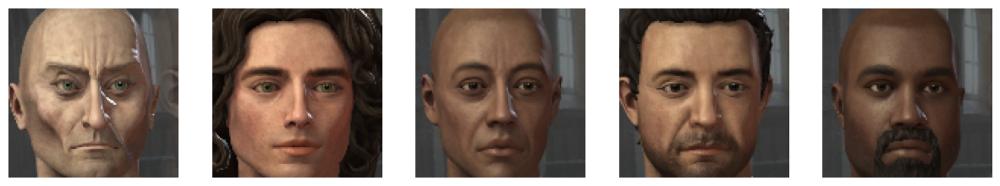

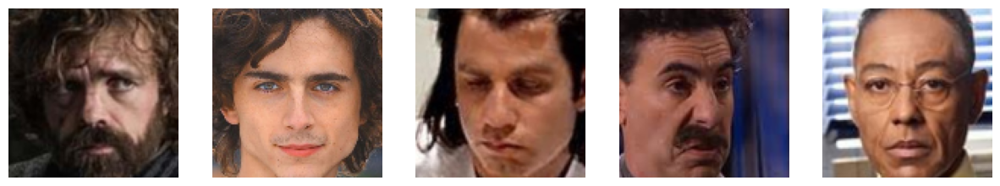

In [128]:
import matplotlib.pyplot as plt
import random

def display_samples(images, n_samples=5):
    fig, axs = plt.subplots(1, n_samples, figsize=(15, 15))
    for i in range(n_samples):
        axs[i].imshow(images[random.randint(0, len(images))])
        axs[i].axis("off")
    plt.show()

display_samples(ck_images)
display_samples(real_images)

In [117]:
print(ck_labels[:10])
print(real_labels[:10])

[PosixPath('female/arabic/faces') PosixPath('female/arabic/faces')
 PosixPath('female/arabic/faces') PosixPath('female/arabic/faces')
 PosixPath('female/arabic/faces') PosixPath('female/arabic/faces')
 PosixPath('female/arabic/faces') PosixPath('female/arabic/faces')
 PosixPath('female/arabic/faces') PosixPath('female/arabic/faces')]
[PosixPath('borat') PosixPath('borat') PosixPath('borat')
 PosixPath('borat') PosixPath('borat') PosixPath('borat')
 PosixPath('borat') PosixPath('borat') PosixPath('borat')
 PosixPath('borat')]


# Visualize embeddings 

## create 2d representations for each face using UMAP

In [129]:
import umap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

model2umap: dict[str, (np.ndarray["X", float], np.ndarray["y", float], umap.UMAP, np.ndarray["X2d", float])] = {}
for model_name in model2ck_embeddings:
    print(model_name)
    ck_embeddings = model2ck_embeddings[model_name]
    real_embeddings = model2real_embeddings[model_name]
    
    X = np.concatenate([ck_embeddings, real_embeddings])
    y = np.concatenate([np.zeros(ck_embeddings.shape[0]), np.ones(real_embeddings.shape[0])])
    reducer = umap.UMAP(metric='cosine')
    X2d = reducer.fit_transform(X)
    model2umap[model_name] = (X, y, reducer, X2d)

arcface-r100
cosface-r100
casia-webface
cosface-r18
cosface-r34
vggface2
arcface-r50
cosface-r50
arcface-r34
arcface-r18


## Visualize 

arcface-r100


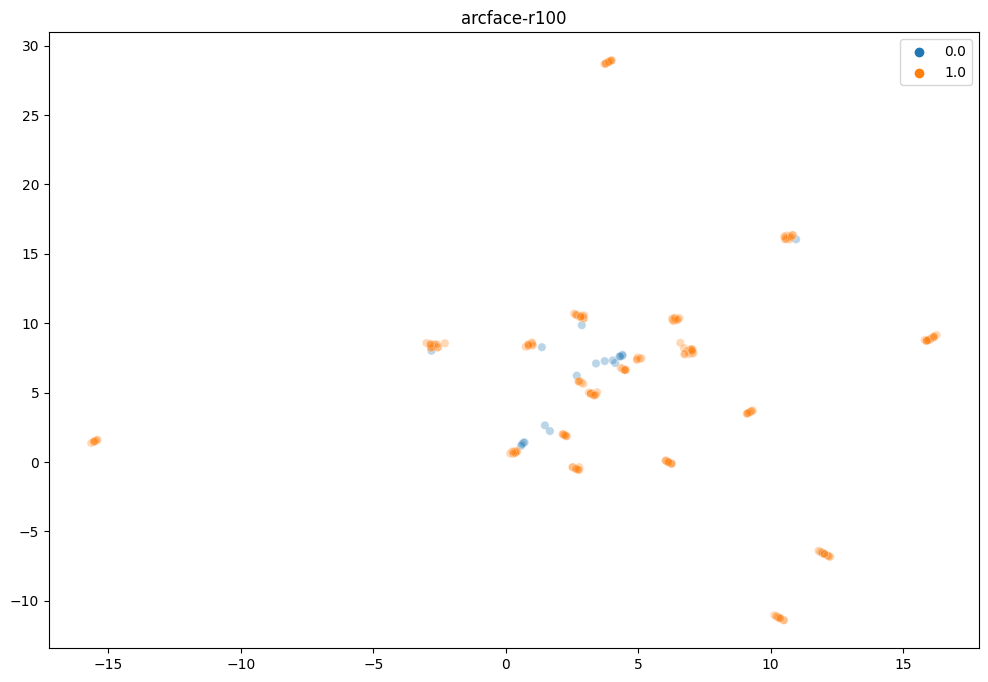

cosface-r100


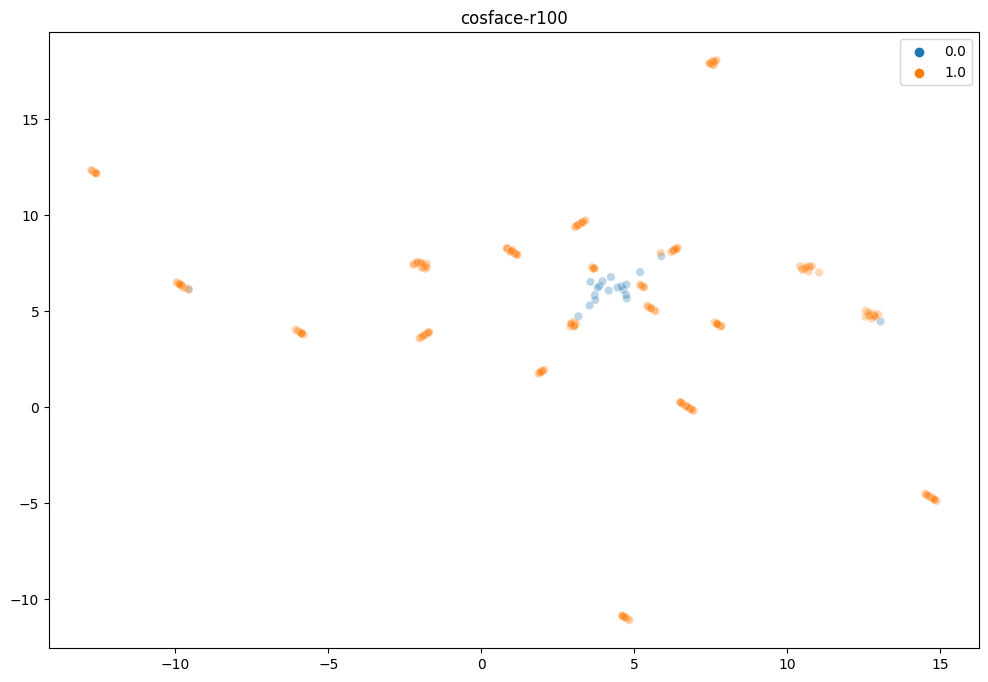

casia-webface


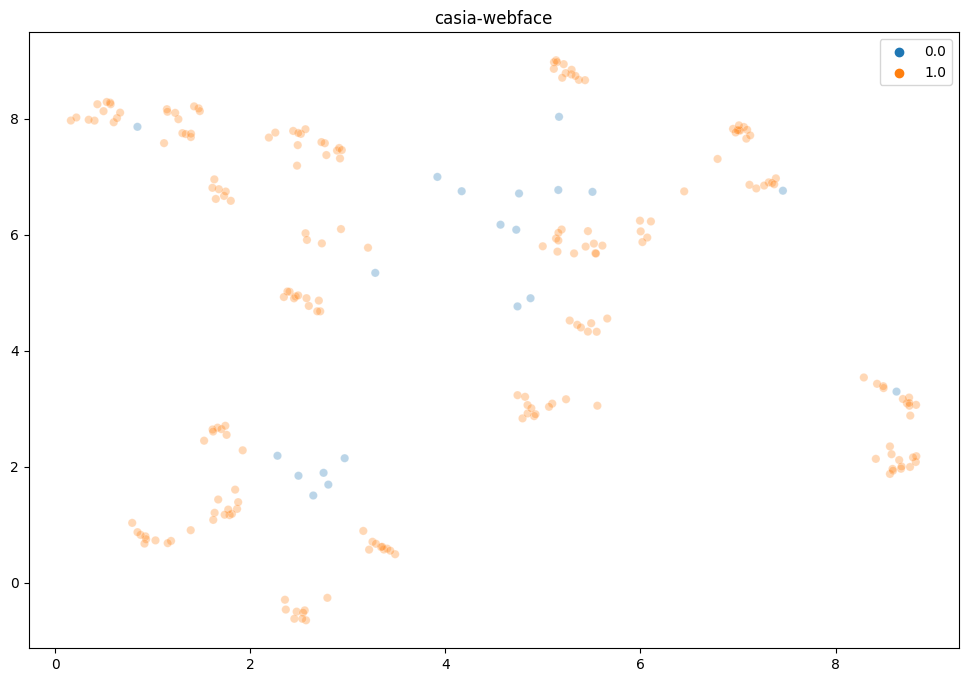

cosface-r18


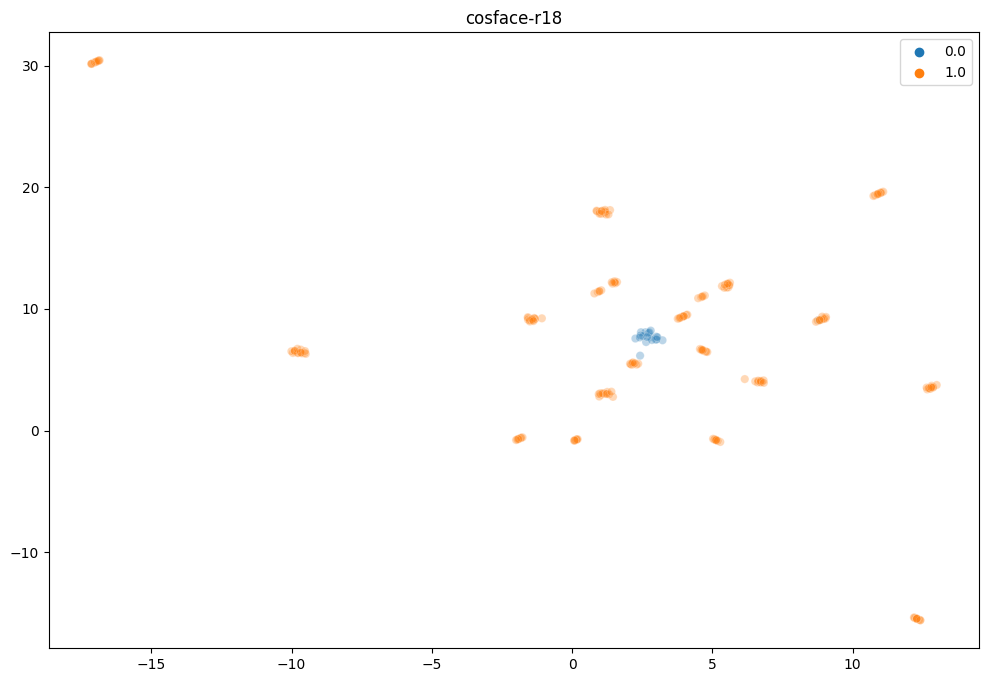

cosface-r34


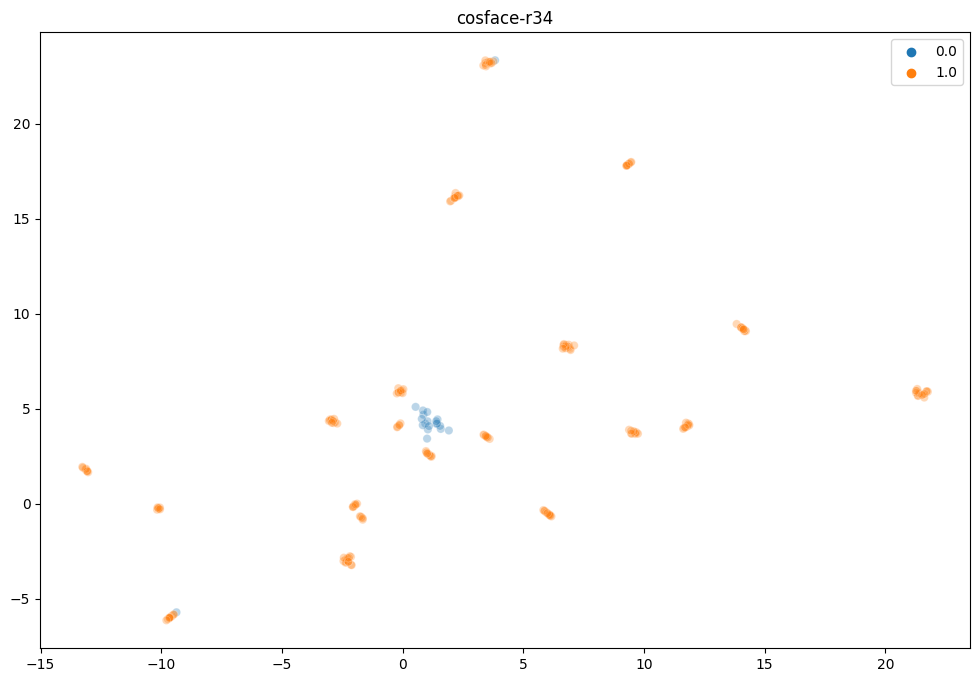

vggface2


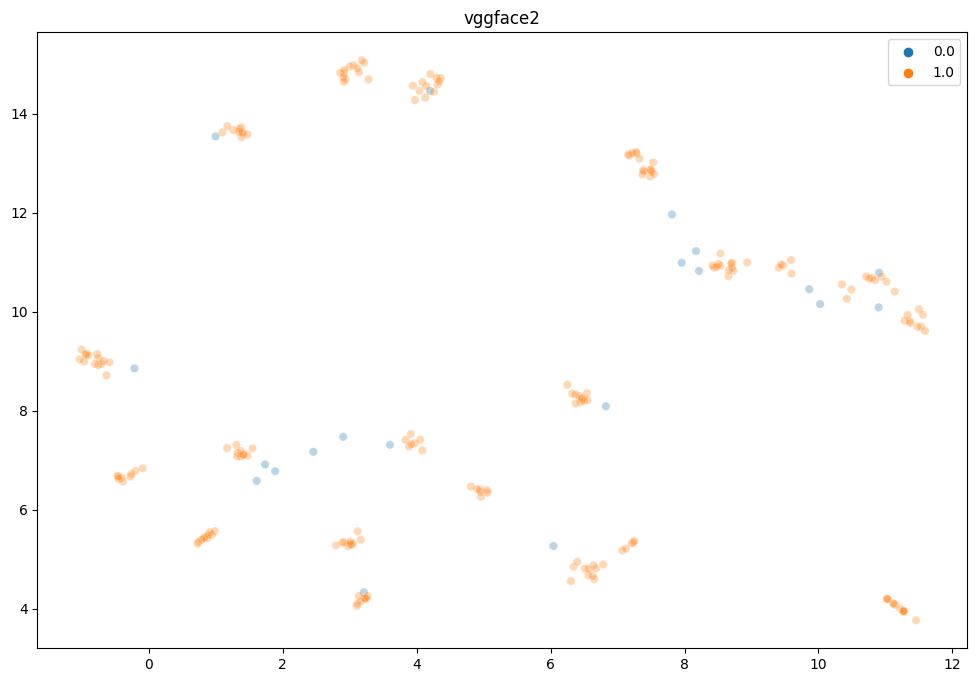

arcface-r50


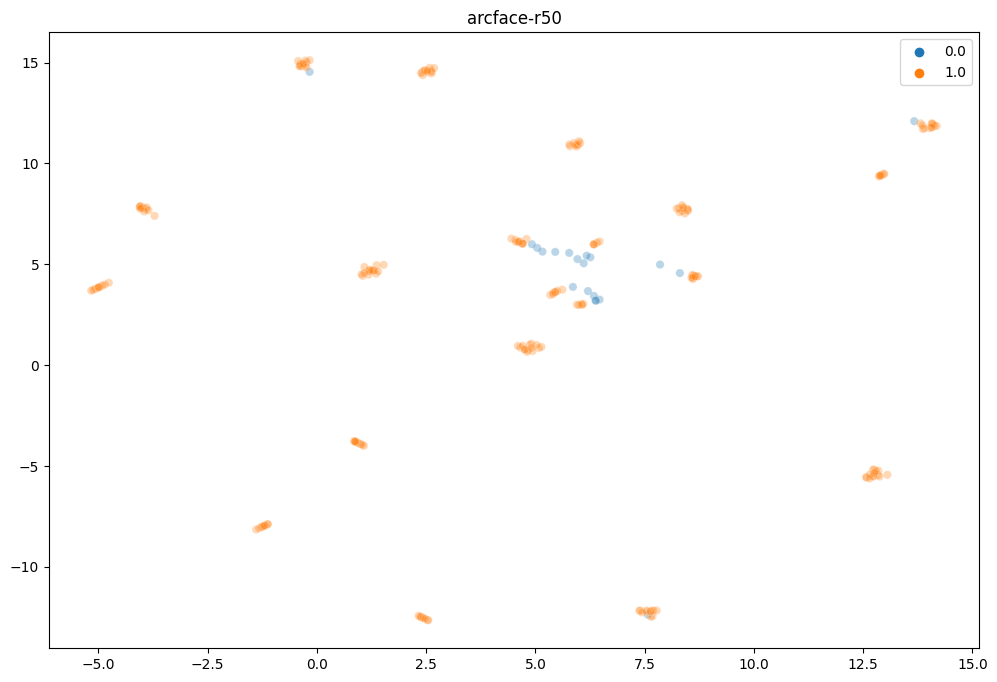

cosface-r50


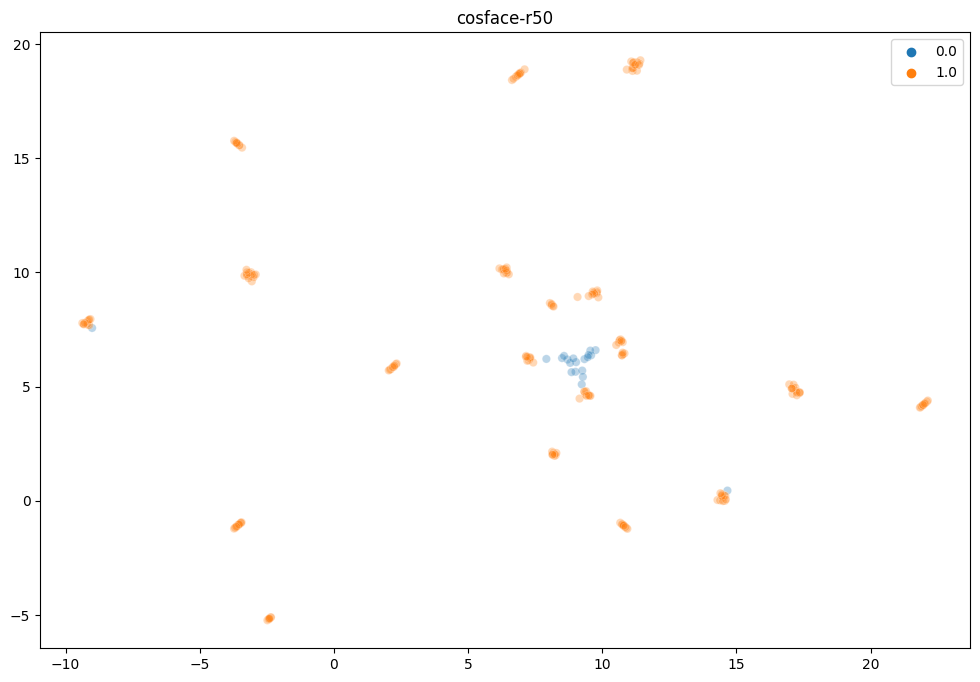

arcface-r34


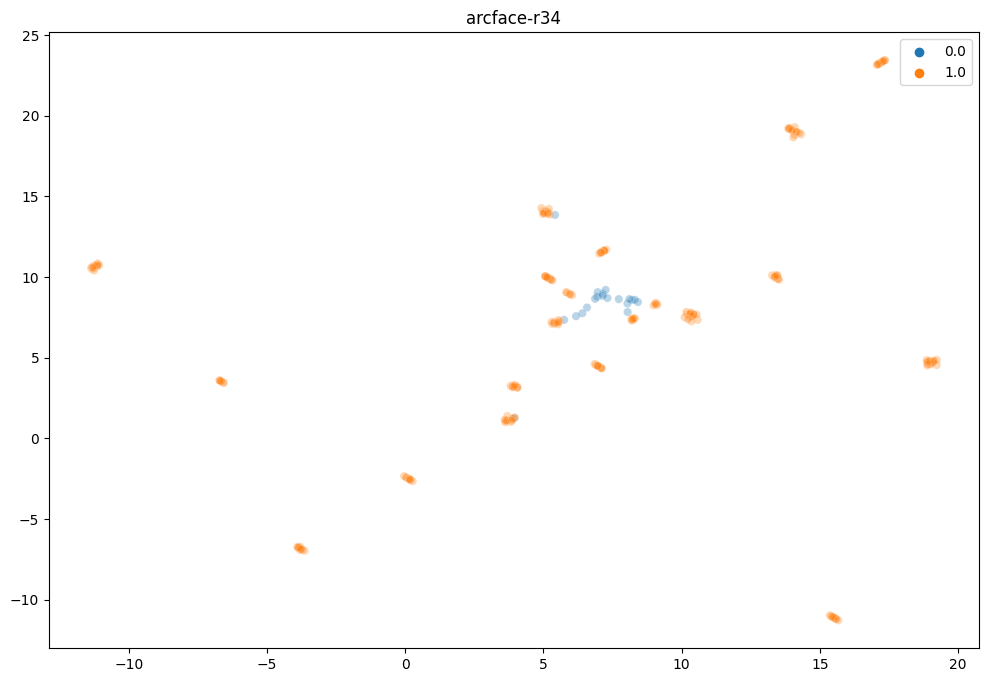

arcface-r18


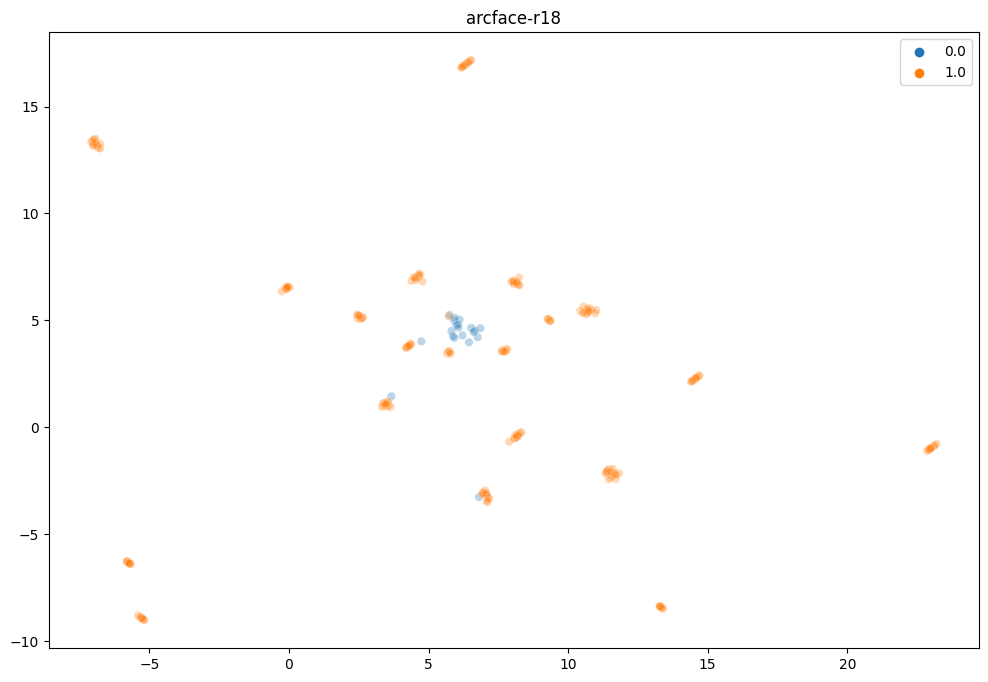

In [131]:
# labels_ck_fixed = np.array([str(label).split("/")[1] for label in ck_labels])

for model_name, (X, y, reducer, X2d) in model2umap.items():
    print(model_name)

    labels = np.concatenate([labels_ck_fixed, ["real"] * real_labels.shape[0]])
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=X2d[:, 0], y=X2d[:, 1],  hue=y, legend="full", alpha=0.3)
    plt.title(model_name)
    plt.show()

## For each real face display closest fake

In [132]:
# get real faces that are closer to ck_faces then real one
from scipy.spatial.distance import cdist

def get_closest_pairs(embeddings_1, embeddings_2, n_pairs=5):
    distances = cdist(embeddings_1, embeddings_2, metric="cosine")
    min_distances = np.min(distances, axis=1)
    min_rows = np.argsort(min_distances)[:n_pairs]
    min_cols = np.argmin(distances[min_rows], axis=1)
    closest_pairs = list(zip(min_rows, min_cols))
    return closest_pairs

model2closest_pairs = {}
for model in model2ck_embeddings:
    real_embeddings = model2real_embeddings[model]
    ck_embeddings = model2ck_embeddings[model]
    closest_pairs = get_closest_pairs(ck_embeddings, real_embeddings, 100)
    model2closest_pairs[model] = set(closest_pairs)


In [133]:
model2real_clossest = {model: {pair[1] for pair in pairs} for model, pairs in model2closest_pairs.items()}
common_clossest = set.intersection(*model2real_clossest.values())
common_clossest

set()

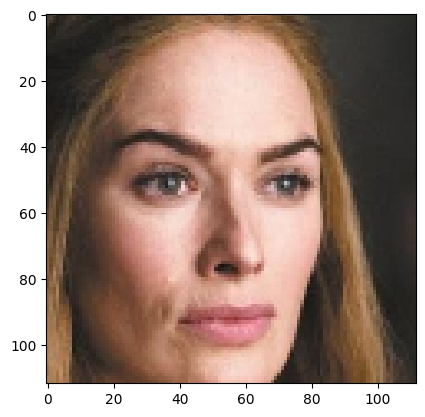

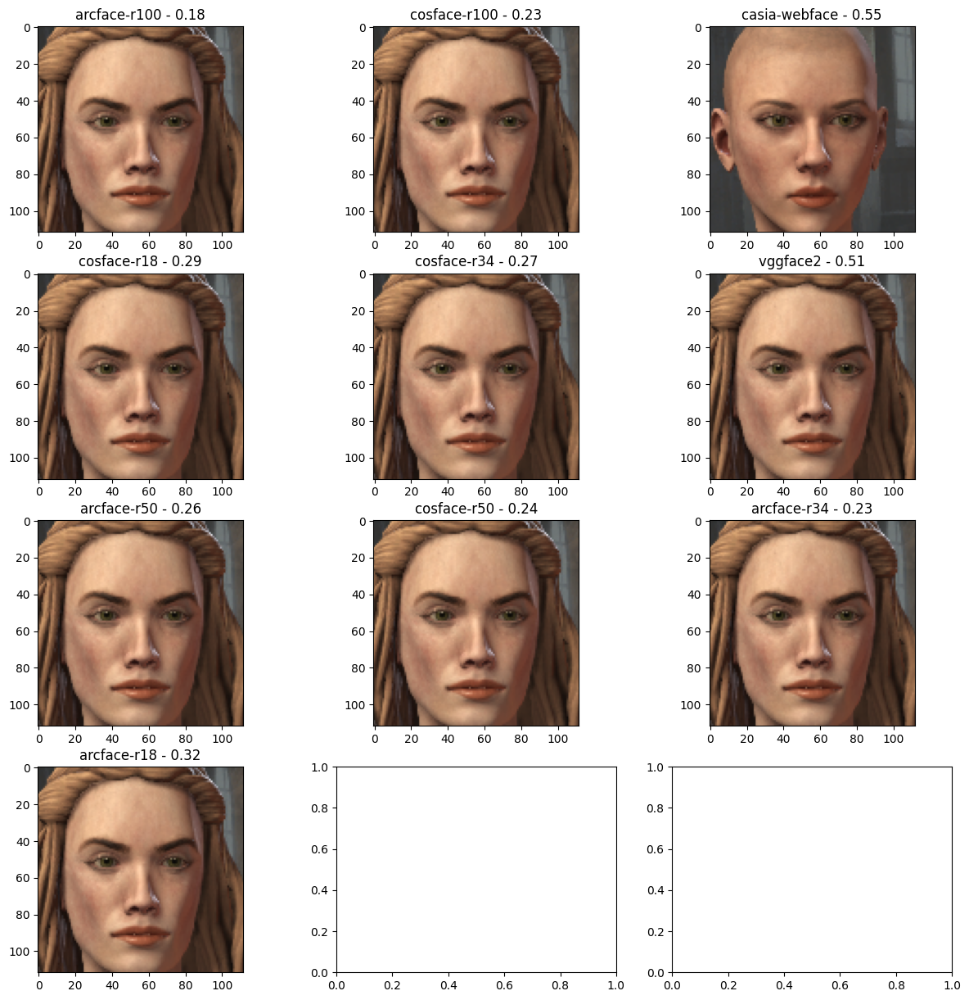

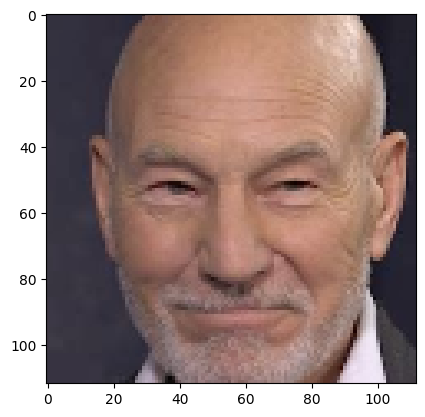

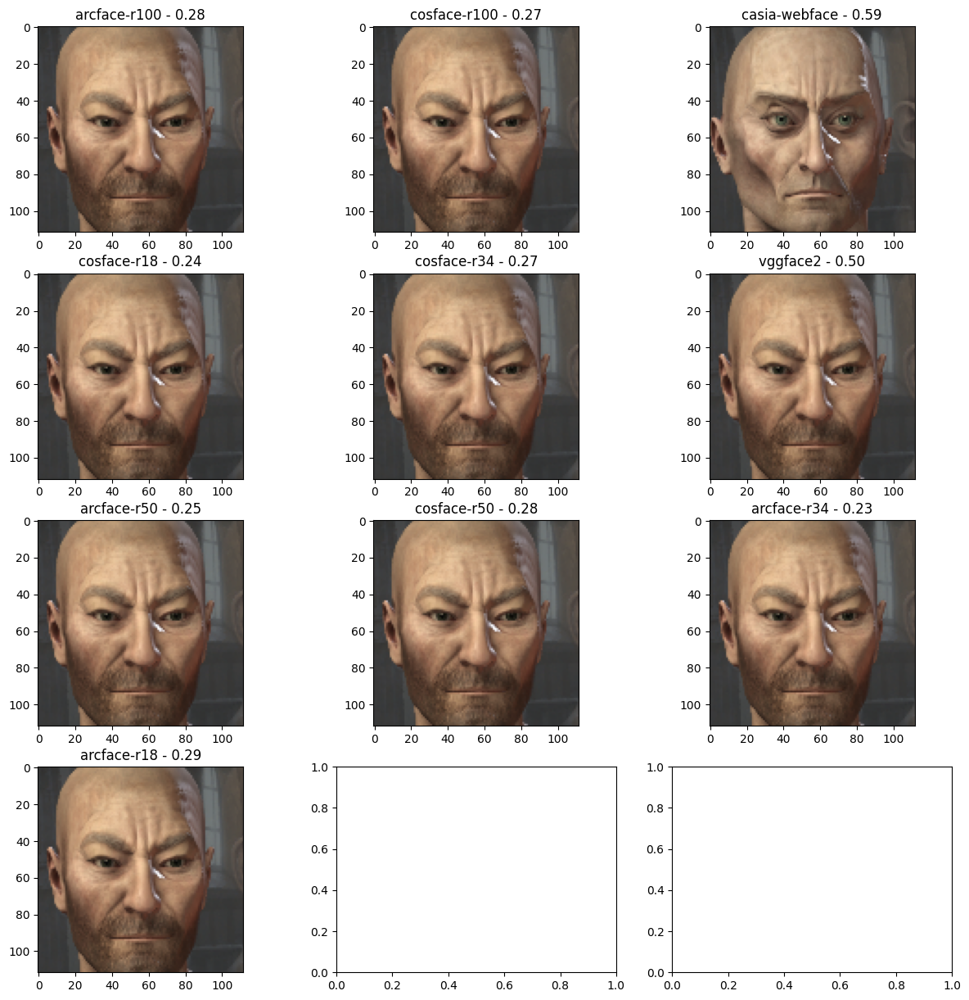

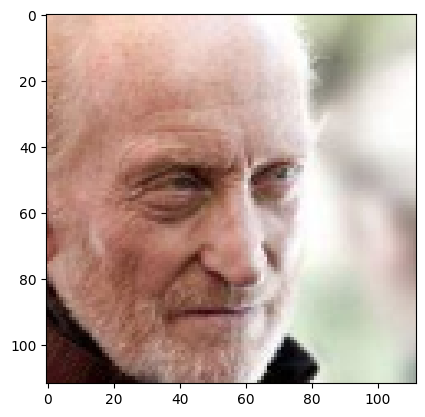

...

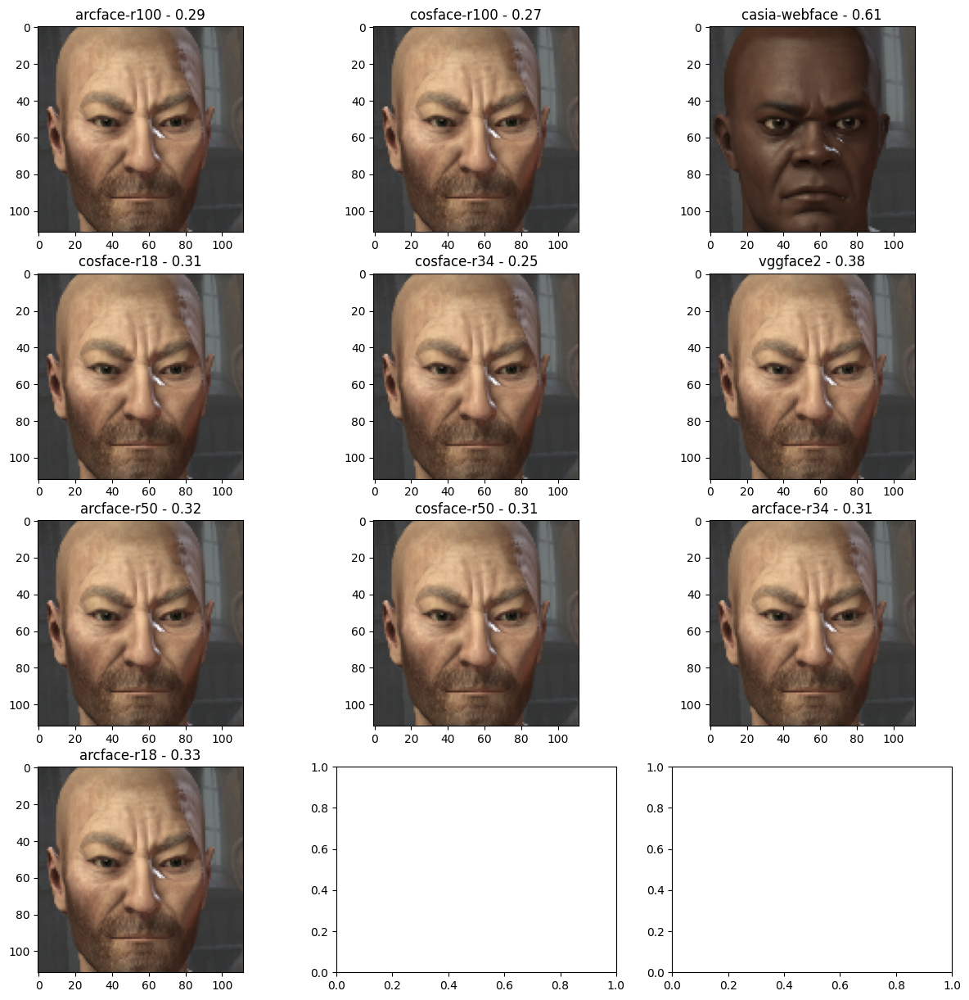

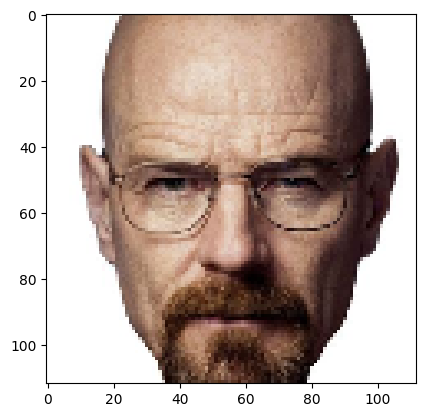

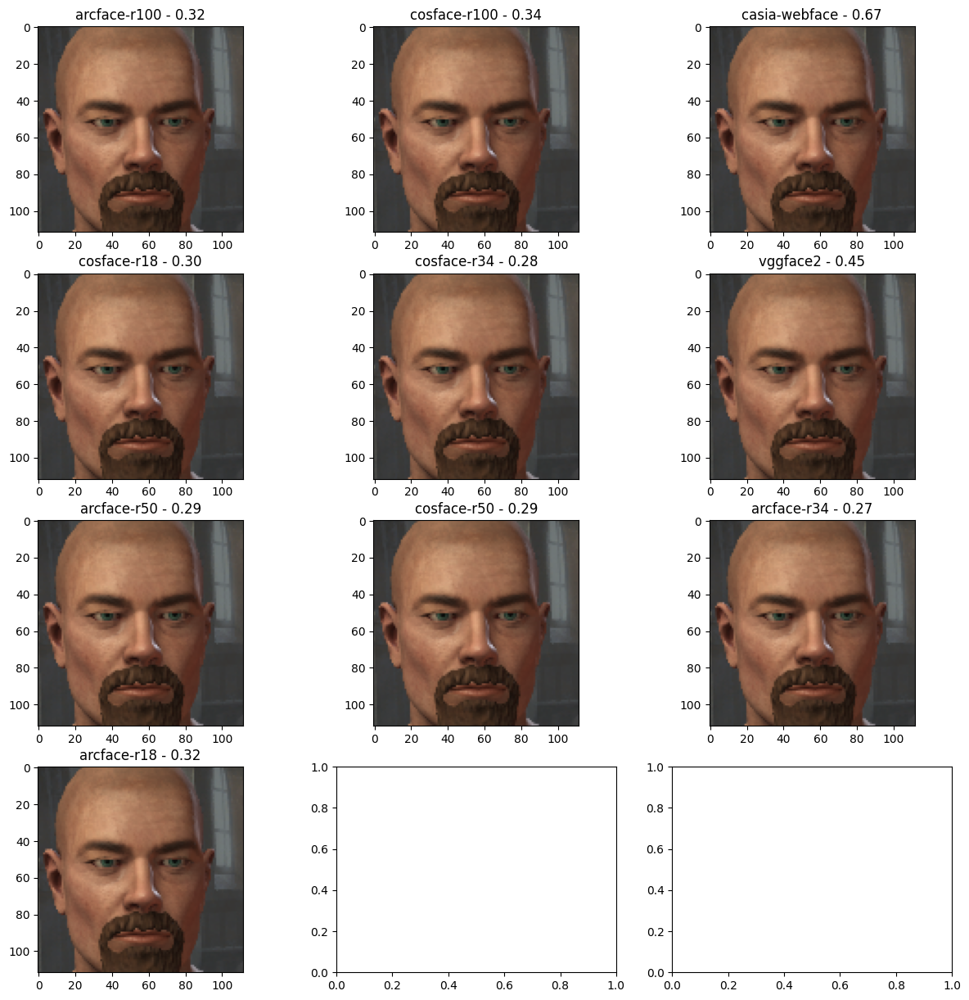

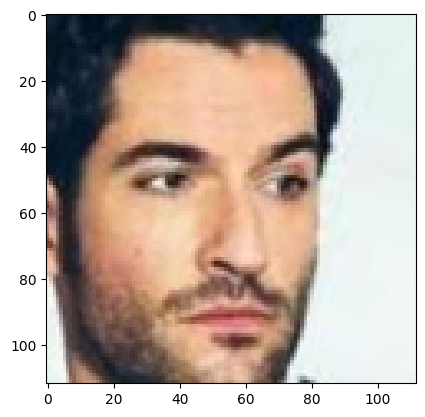

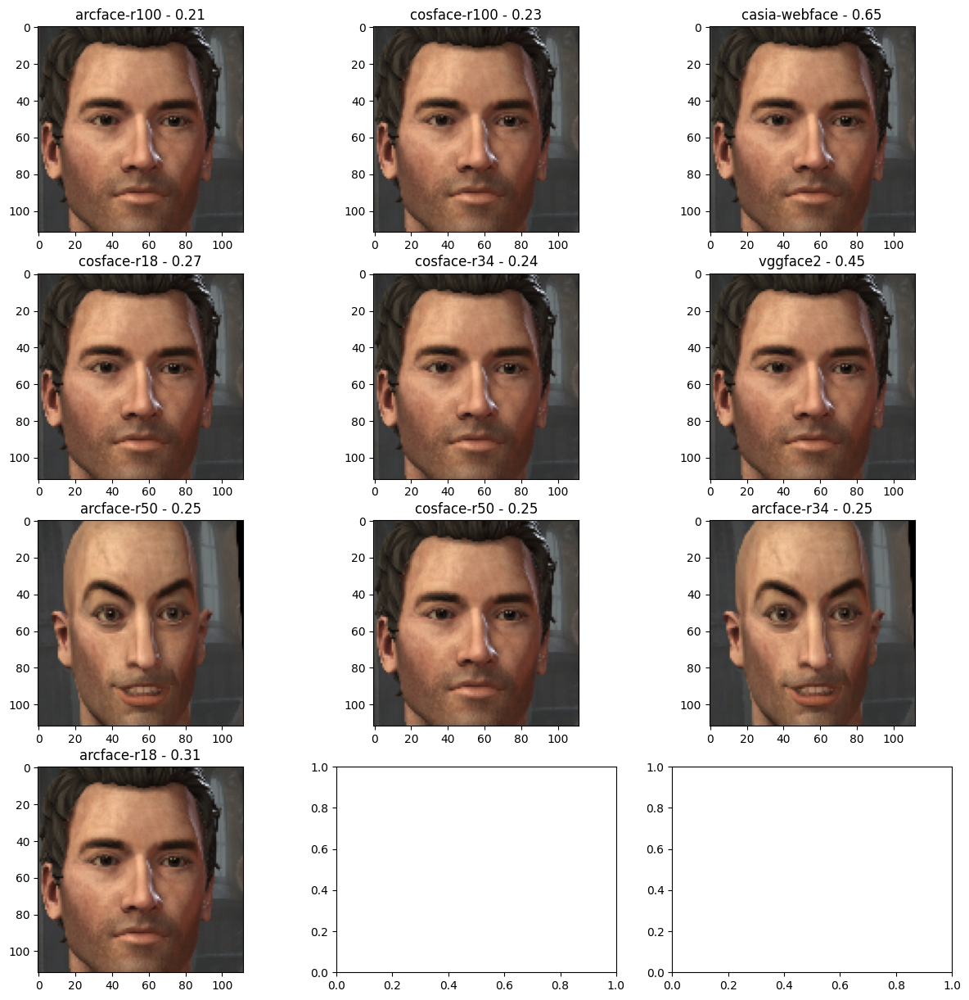

In [134]:
import itertools as it 

real_sample = random.sample(list(it.chain(*model2real_clossest.values())), 10)

for i in real_sample: 
    real_face = real_images[i]
    plt.imshow(real_face)
    plt.show()

    n_cols = 3
    n_rows = int(np.ceil(len(model2ck_embeddings) / n_cols))
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 15))
    for j, model_name in enumerate(model2ck_embeddings):
        real_embedding = model2real_embeddings[model_name][i]
        ck_embeddings = model2ck_embeddings[model_name]
        distances = np.dot(ck_embeddings, real_embedding)
        closest = np.argmax(distances)
        ck_face = ck_images[closest]
        score = distances[closest]
        
        axs[j // n_cols, j % n_cols].imshow(ck_face)
        axs[j // n_cols, j % n_cols].set_title(f"{model_name} - {score:.2f}")
    plt.show()

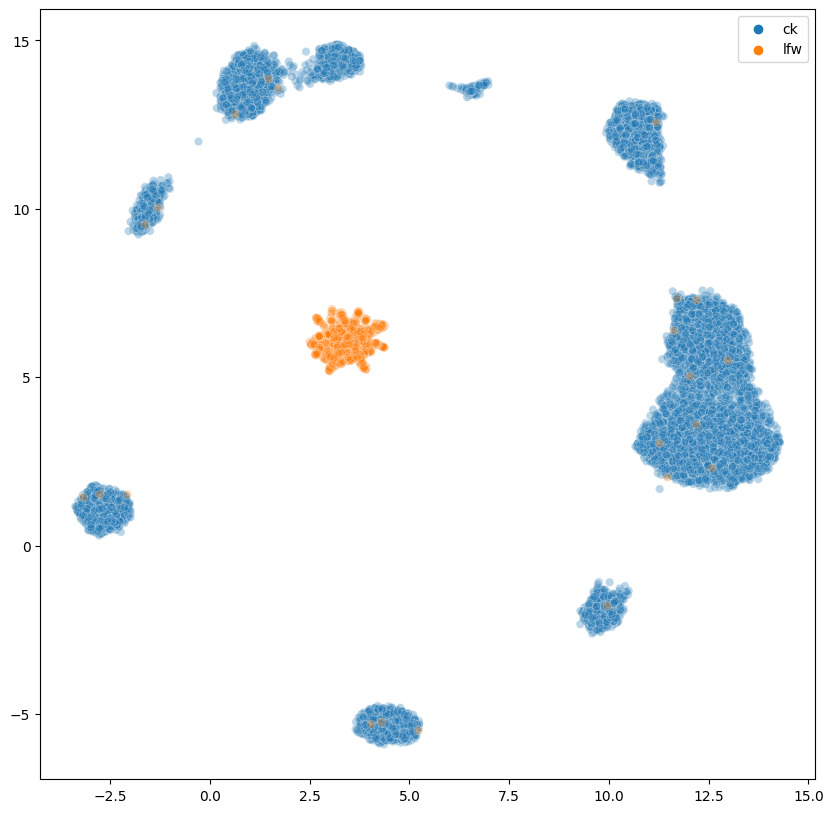

In [4]:
# visualize embeddings using UMAP
import umap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


X = np.concatenate([ck_embeddings, lfw_embeddings])
X = X / np.linalg.norm(X, axis=1, keepdims=True)
y = np.array(["ck"] * ck_embeddings.shape[0] + ["lfw"] * lfw_embeddings.shape[0])

reducer = umap.UMAP(metric="cosine")
embeddings_2d = reducer.fit_transform(X)

plt.figure(figsize=(10, 10))
sns.scatterplot(
    x=embeddings_2d[:, 0], y=embeddings_2d[:, 1], hue=y, legend="full", alpha=0.3
)
plt.show()

## clustering

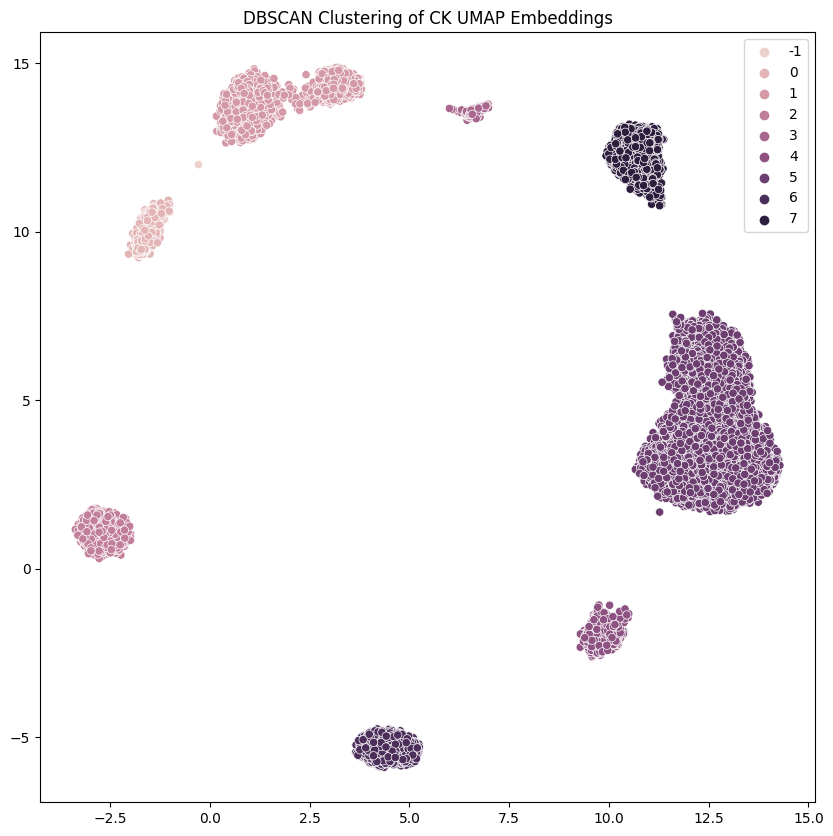

In [5]:
from sklearn.cluster import DBSCAN

ck_embeddings_2d = embeddings_2d[y == "ck"]

dbscan = DBSCAN(eps=0.5, min_samples=10)
dbscan_ck_labels = dbscan.fit_predict(ck_embeddings_2d)

plt.figure(figsize=(10, 10))
sns.scatterplot(
    x=ck_embeddings_2d[:, 0], y=ck_embeddings_2d[:, 1], hue=dbscan_ck_labels, legend="full", alpha=1
)
plt.title("DBSCAN Clustering of CK UMAP Embeddings")
plt.show()

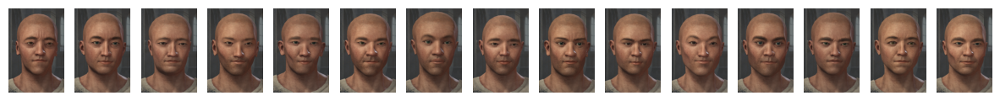

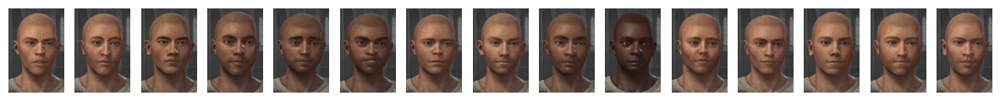

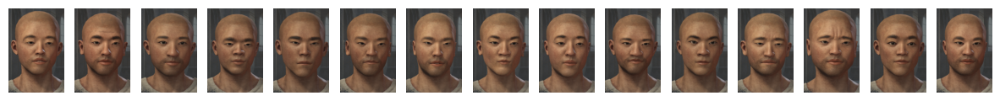

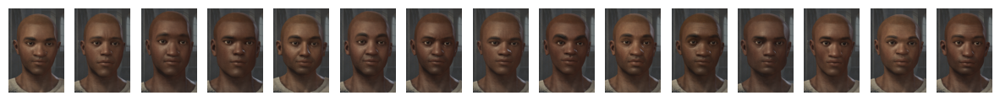

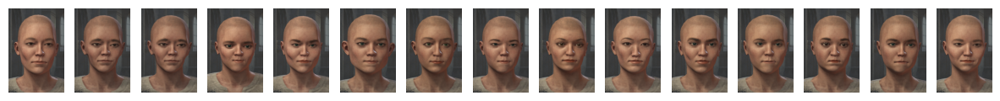

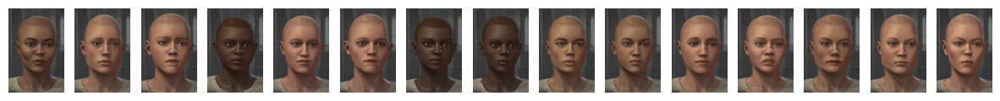

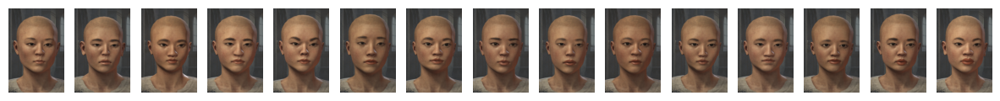

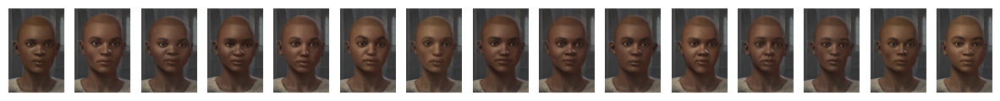

In [8]:
for label in set(dbscan_ck_labels) - {-1}:
    cluster_images = ck_images[dbscan_ck_labels == label]
    display_samples(cluster_images, n_samples=15)

# Display clossest fake-real pairs

In [95]:
from sklearn.metrics.pairwise import cosine_similarity
a = np.array([
    [1, 1, 1],
    [2, 2, 2],
    [3, 2, 3]
])

print(cosine_similarity(a, a))
1 - cdist(a, a, metric="cosine")

[[1.         1.         0.98473193]
 [1.         1.         0.98473193]
 [0.98473193 0.98473193 1.        ]]


array([[1.        , 1.        , 0.98473193],
       [1.        , 1.        , 0.98473193],
       [0.98473193, 0.98473193, 1.        ]])

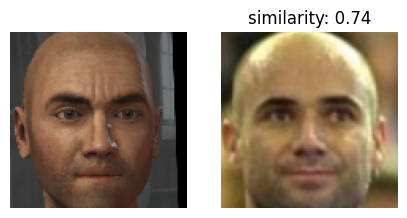

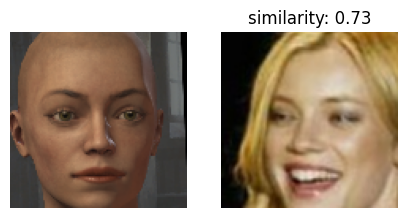

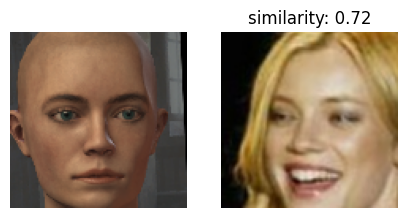

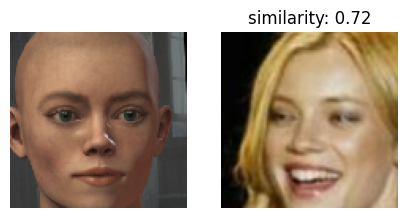

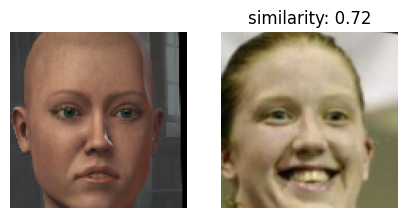

...

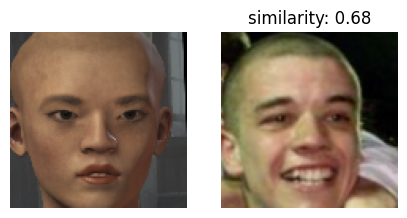

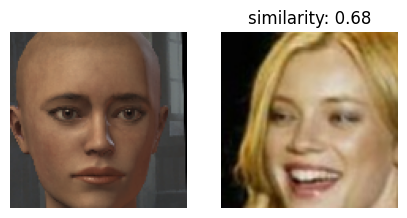

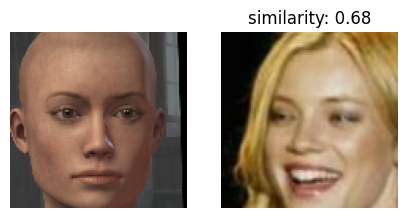

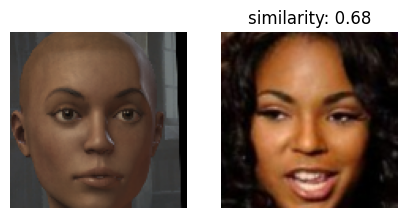

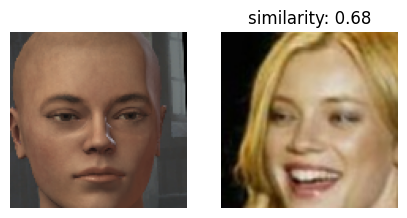

In [98]:
# get closest pairs of images that are from two different datasets
from scipy.spatial.distance import cdist
from tqdm import tqdm

def get_closest_pairs(embeddings_1, embeddings_2, n_pairs=5):
    distances = cdist(embeddings_1, embeddings_2, metric="cosine")
    min_distances = np.min(distances, axis=1)
    min_rows = np.argsort(min_distances)[:n_pairs]
    min_cols = np.argmin(distances[min_rows], axis=1)
    closest_pairs = list(zip(min_rows, min_cols))
    return closest_pairs, distances

closest_pairs, distances = get_closest_pairs(model2ck_embeddings["vggface2"], model2real_embeddings["vggface2"], n_pairs=25)
for ck_idx, lfw_idx in closest_pairs:
    ck_img = ck_images[ck_idx]
    lfw_img = real_images[lfw_idx]
    fig, axs = plt.subplots(1, 2, figsize=(5, 10))
    axs[0].imshow(ck_img)
    axs[0].axis("off")
    axs[1].imshow(lfw_img)
    axs[1].axis("off")
    plt.title(f"similarity: {1 - distances[ck_idx, lfw_idx]:.2f}")
    plt.show()

# Which features are the most distinguishing?

In [10]:
# use RFE to get the most important features using SVC
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

n_features = int(X.shape[1] / 2)
svc = SVC(kernel="linear", C=1)
rfe = RFE(estimator=svc, n_features_to_select=n_features, step=1)
rfe.fit(X, y)

print("Num Features: %d" % rfe.n_features_)
print("Selected Features: %s" % rfe.support_)
print("Feature Ranking: %s" % rfe.ranking_)

Num Features: 256
Selected Features: [False  True  True False  True  True False  True False False  True  True
  True False  True False  True  True  True  True  True  True False False
 False False False False False False False  True False False  True  True
 False  True  True  True  True False  True  True  True False False  True
  True  True False  True False False False  True  True False False  True
 False False False False  True  True False False  True  True  True False
  True False False False  True False  True False  True False  True  True
 False False  True False  True False  True False  True  True  True  True
  True False  True False False False False False False False False False
  True  True  True  True False False False  True False  True  True False
  True  True False  True False False False  True False  True False False
 False False  True  True  True False  True  True False False  True False
  True False False  True  True  True False False  True False  True False
 False  True  

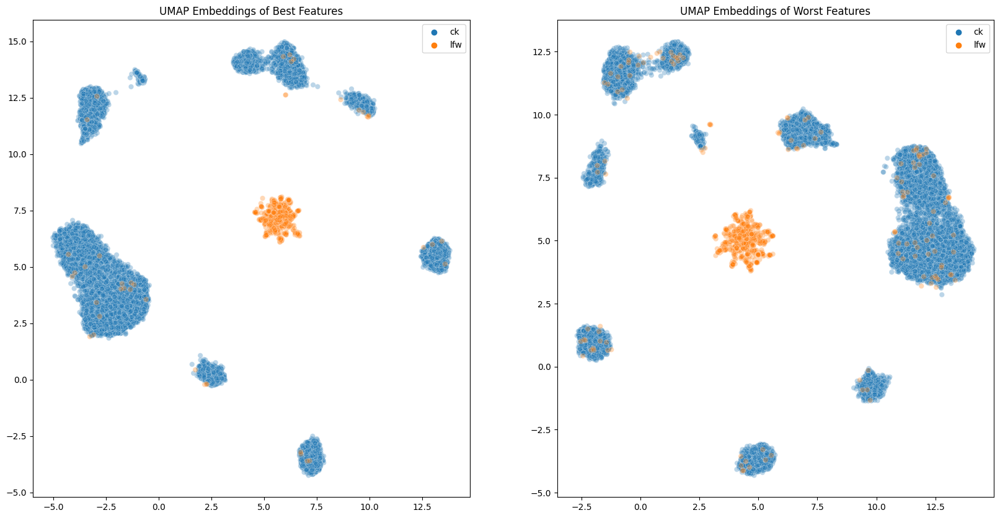

In [11]:
best_features, worst_features = rfe.support_, ~rfe.support_
X_best, X_worst = X[:, best_features], X[:, worst_features]

# display umap embeddings of best and worst features
reducer = umap.UMAP(metric="cosine")
embeddings_2d_best = reducer.fit_transform(X_best)
embeddings_2d_worst = reducer.fit_transform(X_worst)

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
sns.scatterplot(
    x=embeddings_2d_best[:, 0], y=embeddings_2d_best[:, 1], hue=y, legend="full", alpha=0.3, ax=axs[0]
)
sns.scatterplot(
    x=embeddings_2d_worst[:, 0], y=embeddings_2d_worst[:, 1], hue=y, legend="full", alpha=0.3, ax=axs[1]
)
axs[0].set_title("UMAP Embeddings of Best Features")
axs[1].set_title("UMAP Embeddings of Worst Features")
plt.show()

## Closest fake-real pairs for worst features

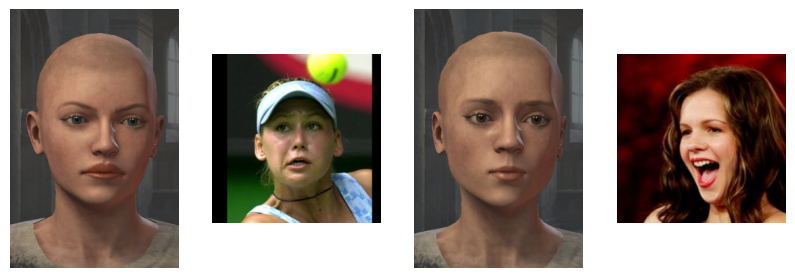

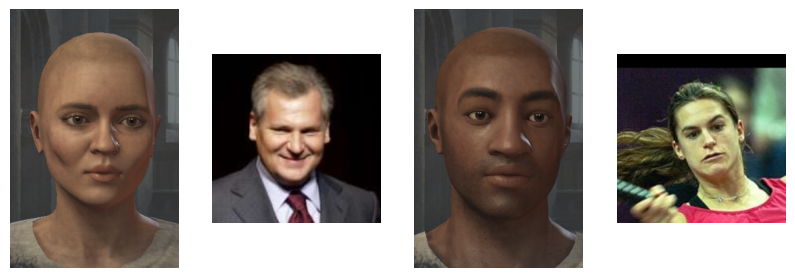

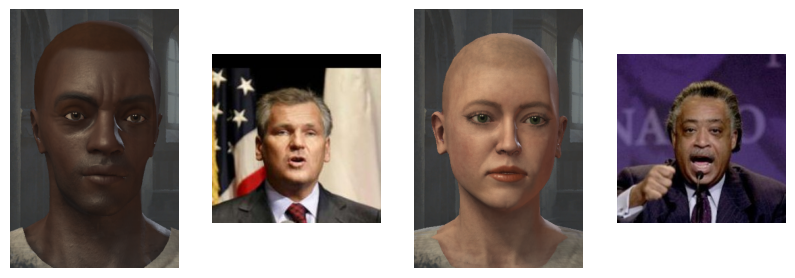

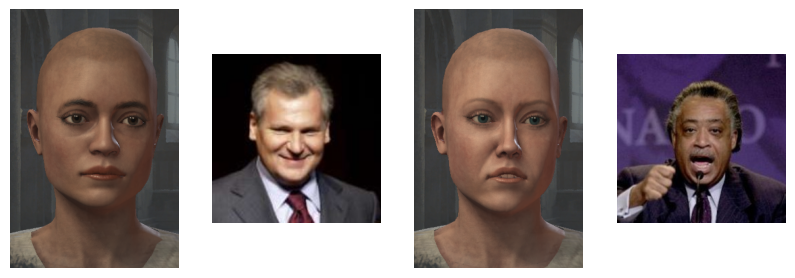

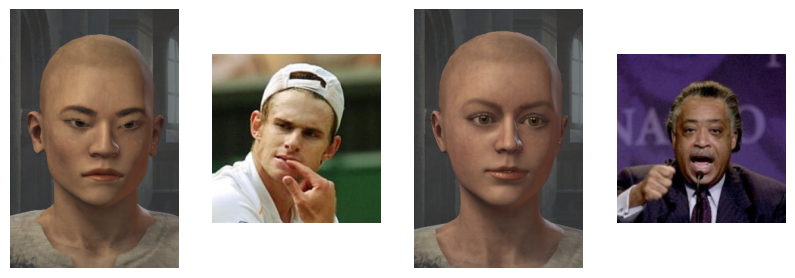

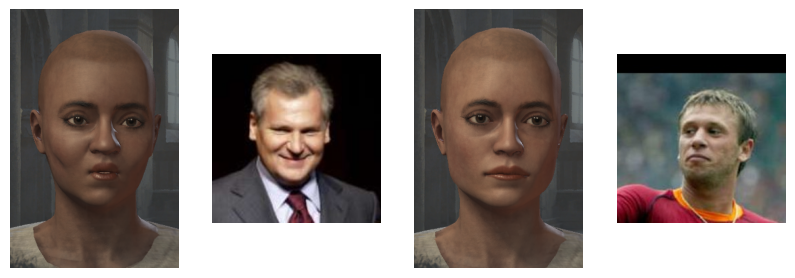

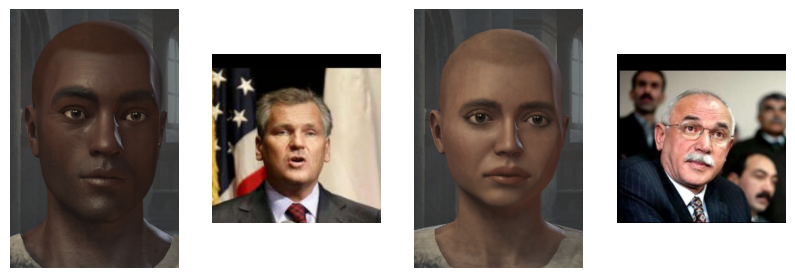

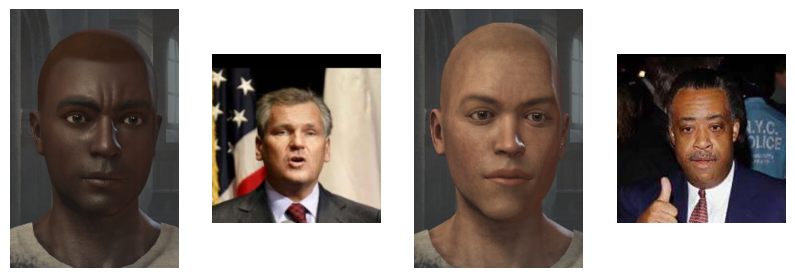

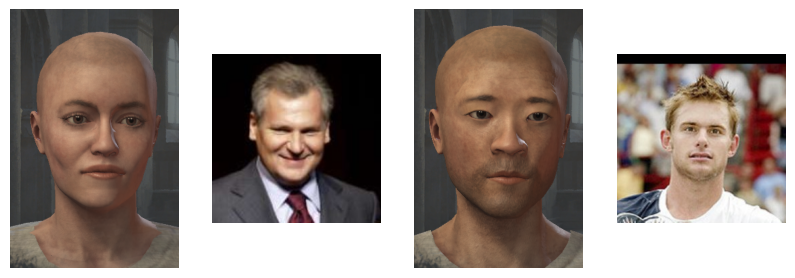

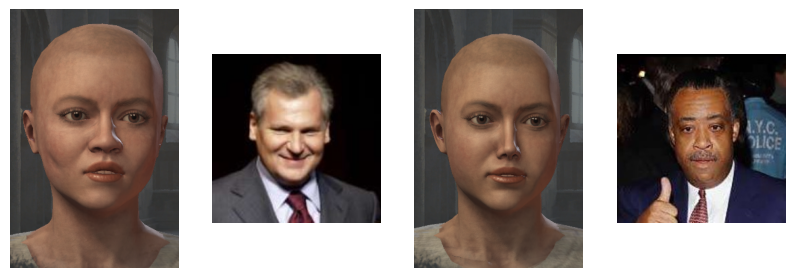

In [12]:
closest_pairs_worst = get_closest_pairs(ck_embeddings[:, worst_features], lfw_embeddings[:, worst_features], n_pairs=10)
closest_pairs_best = get_closest_pairs(ck_embeddings[:, best_features], lfw_embeddings[:, best_features], n_pairs=10)

for (ck_idx_w, lfw_idx_w), (ck_idx_b, lfw_idx_b) in zip(closest_pairs_worst, closest_pairs_best):
    ck_img_w = ck_images[ck_idx_w]
    lfw_img_w = lfw_images[lfw_idx_w]
    ck_img_b = ck_images[ck_idx_b]
    lfw_img_b = lfw_images[lfw_idx_b]
    fig, axs = plt.subplots(1, 4, figsize=(10, 10))
    axs[0].imshow(ck_img_w)
    axs[0].axis("off")
    axs[1].imshow(lfw_img_w)
    axs[1].axis("off")
    axs[2].imshow(ck_img_b)
    axs[2].axis("off")
    axs[3].imshow(lfw_img_b)
    axs[3].axis("off")
    plt.show()